### Gauraw Kishore Tripathy
### NoSQL Mini Project Sem3
### AA.SC.P2MCA2107415

# Zomato-Data-Analysis using mongoDB

MongoDB is a source-available cross-platform document-oriented database program.

Classified as a NoSQL database program, MongoDB uses JSON-like documents with optional schemas.

MongoDB is a distributed database at its core.

PyMongo is a Python distribution containing tools for working with MongoDB, and is the recommended way to work with MongoDB from Python.

# Importing Packages

For accessing client: 

In [1]:
import pymongo
from pymongo import MongoClient 
    
# Connect with the portnumber and host  
client = MongoClient("mongodb://localhost:27017/") 

For preprocessing:

In [2]:
import pandas as pd
import json
import numpy as np

In [3]:
import matplotlib.pyplot as plt
import plotly.offline as pyo
from matplotlib import style
from plotly.offline import init_notebook_mode, plot ,iplot
plt.rcParams['figure.figsize'] = 17,7
style.use("ggplot")
pyo.init_notebook_mode(connected=True)

# About Dataset 

url : contains the url of the restaurant in the zomato website

address : contains the address of the restaurant in Bengaluru

name : contains the name of the restaurant

online_order : whether online ordering is available in the restaurant or not

book_table : table book option available or not

rate : contains the overall rating of the restaurant out of 5

votes : contains total number of rating for the restaurant as of the above mentioned date

phone : contains the phone number of the restaurant

location : contains the neighborhood in which the restaurant is located

rest_type : restaurant type

dish_liked : dishes people liked in the restaurant

cuisines : food styles, separated by comma

approx_cost(for two people) : contains the approximate cost for meal for two people

reviews_list : list of tuples containing reviews for the restaurant, each tuple consists of two values, rating and review by the customer

menu_item : contains list of menus available in the restaurant

listed_in(type) : type of meal

listed_in(city) : contains the neighborhood in which the restaurant is listed

# Reading and analysing dataset

In [4]:
data= pd.read_csv("C:\\Users\\Gauraw\\Downloads\\zomato.csv")
data.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


# Converting to JSON:

In [5]:
json_data = json.loads(data.to_json(orient='records'))

# Accessing Database

In [6]:
dblist=client.list_database_names()
dblist

['admin', 'bdmszomo', 'config', 'employee_db', 'local', 'test']

In [7]:
mydb = client['bdmszomo'] 
collection = mydb['zomo']

In [8]:
collection.insert_many(json_data)

# Dataset

In [9]:
list(collection.find())

[{'_id': ObjectId('6447eaadca74cdab45c0db1d'),
  'url': 'https://www.zomato.com/bangalore/jalsa-banashankari?context=eyJzZSI6eyJlIjpbNTg2OTQsIjE4Mzc1NDc0IiwiNTkwOTAiLCIxODM4Mjk0NCIsIjE4MjI0Njc2IiwiNTkyODkiLCIxODM3MzM4NiJdLCJ0IjoiUmVzdGF1cmFudHMgaW4gQmFuYXNoYW5rYXJpIHNlcnZpbmcgQnVmZmV0In19',
  'address': '942, 21st Main Road, 2nd Stage, Banashankari, Bangalore',
  'name': 'Jalsa',
  'online_order': 'Yes',
  'book_table': 'Yes',
  'rate': '4.1/5',
  'votes': 775,
  'phone': '080 42297555\r\n+91 9743772233',
  'location': 'Banashankari',
  'rest_type': 'Casual Dining',
  'dish_liked': 'Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
  'cuisines': 'North Indian, Mughlai, Chinese',
  'approx_cost(for two people)': 800,
  'reviews_list': '[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited 

# Preprocessing some values

We will be using the update_many method to update multiple documents in our MongoDB collection. Let's break down the below code step by step:

collection.update_many({}, [...] - This line specifies that we want to update multiple documents in the collection. The {} represents an empty filter, meaning it will match all documents in the collection. We can modify this filter to match specific documents if needed.

[{"$set": {"approx_cost(for two people)": {"$convert":{"input" : "$approx_cost(for two people)", "to":"int", "onError":"$approx_cost(for two people)", "onNull": None}}}}]) - This is the update operation to be performed on the matched documents.

"$set" is a MongoDB update operator that specifies the field(s) to be updated.

"approx_cost(for two people)" is the field name within the documents that will be updated.

"$convert" is a MongoDB aggregation operator used to convert the value of a field to a specific data type.

"input" : "$approx_cost(for two people)" specifies the field from which the value will be extracted and converted. In this case, it's the field "approx_cost(for two people)".

"to": "int" indicates the desired data type to which the value will be converted. In this case, it's an integer.

"onError": "$approx_cost(for two people)" specifies the value to use if the conversion encounters an error. Here, it uses the existing value of "approx_cost(for two people)".

"onNull": None defines the value to use if the field is null or does not exist. In this case, it sets the value to None.

So, in summary, the below code updates all documents in the MongoDB collection by converting the value of the "approx_cost(for two people)" field to an integer. If the conversion encounters an error or if the field is null, it retains the existing value or sets it to None, respectively.

In [10]:
collection.update_many({},[{"$set": {"approx_cost(for two people)": {"$convert":{"input" : "$approx_cost(for two people)", "to":"int", "onError":"$approx_cost(for two people)", "onNull": None}}}}])

In [11]:
# checking for changes
list(collection.find())

[{'_id': ObjectId('6447eaadca74cdab45c0db1d'),
  'url': 'https://www.zomato.com/bangalore/jalsa-banashankari?context=eyJzZSI6eyJlIjpbNTg2OTQsIjE4Mzc1NDc0IiwiNTkwOTAiLCIxODM4Mjk0NCIsIjE4MjI0Njc2IiwiNTkyODkiLCIxODM3MzM4NiJdLCJ0IjoiUmVzdGF1cmFudHMgaW4gQmFuYXNoYW5rYXJpIHNlcnZpbmcgQnVmZmV0In19',
  'address': '942, 21st Main Road, 2nd Stage, Banashankari, Bangalore',
  'name': 'Jalsa',
  'online_order': 'Yes',
  'book_table': 'Yes',
  'rate': '4.1/5',
  'votes': 775,
  'phone': '080 42297555\r\n+91 9743772233',
  'location': 'Banashankari',
  'rest_type': 'Casual Dining',
  'dish_liked': 'Pasta, Lunch Buffet, Masala Papad, Paneer Lajawab, Tomato Shorba, Dum Biryani, Sweet Corn Soup',
  'cuisines': 'North Indian, Mughlai, Chinese',
  'approx_cost(for two people)': 800,
  'reviews_list': '[(\'Rated 4.0\', \'RATED\\n  A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited 

# Number of hotels in Bangalore

The below code is aggregating the documents in the collection based on the "name" field and counting the number of occurrences for each unique "name" value. The result will be stored in the q0_agg_result variable. Each document in the result will have the "_id" field containing a unique "name" value and the "count" field indicating the number of occurrences of that "name" value in the collection. Let's brake the code:

q0_agg_result is a variable that will hold the result of the aggregation operation.

collection.aggregate([...]) executes the aggregation pipeline on the specified collection. The pipeline is defined within the square brackets.

[{"$group": {"_id": "$name", "count": { "$sum": 1 }}}] is the aggregation pipeline, consisting of a single stage using the $group operator.

"$group" is a MongoDB aggregation operator that groups documents together based on a specified key or field.

"_id": "$name" specifies that the grouping will be performed based on the values of the "name" field. Each unique value of "name" will become a separate group.

"count": { "$sum": 1 } creates a new field called "count" for each group and counts the number of documents within that group. The $sum operator is used to increment the count by 1 for each document.

From this we can get number of food spots in Banglore which is in collaboration with Zomato. 


In [12]:
q0_agg_result=collection.aggregate([{ "$group": {"_id": "$name", "count": { "$sum": 1 } } }])

In [13]:
len(list(q0_agg_result))

8792

# Number of orders in each Location

The below code is performing an aggregation operation on the MongoDB collection. It groups the documents based on the "listed_in(city)" field, counts the number of documents in each group, and then sorts the groups based on the count in descending order. The resulting grouped and sorted documents are stored in the q1_agg_result variable as a list.


In [14]:
q1_agg_result=collection.aggregate([{ "$group": {"_id": "$listed_in(city)", "count": { "$sum": 1 } } },{"$sort": { "count": -1 } }])
list(q1_agg_result)

[{'_id': 'BTM', 'count': 9837},
 {'_id': 'Koramangala 7th Block', 'count': 8814},
 {'_id': 'Koramangala 5th Block', 'count': 8508},
 {'_id': 'Koramangala 4th Block', 'count': 8337},
 {'_id': 'Koramangala 6th Block', 'count': 7869},
 {'_id': 'Jayanagar', 'count': 7113},
 {'_id': 'JP Nagar', 'count': 6288},
 {'_id': 'Indiranagar', 'count': 5580},
 {'_id': 'Church Street', 'count': 5481},
 {'_id': 'MG Road', 'count': 5433},
 {'_id': 'Brigade Road', 'count': 5307},
 {'_id': 'Lavelle Road', 'count': 5232},
 {'_id': 'HSR', 'count': 5223},
 {'_id': 'Marathahalli', 'count': 4977},
 {'_id': 'Whitefield', 'count': 4860},
 {'_id': 'Residency Road', 'count': 4860},
 {'_id': 'Bannerghatta Road', 'count': 4851},
 {'_id': 'Brookefield', 'count': 4554},
 {'_id': 'Old Airport Road', 'count': 4275},
 {'_id': 'Kammanahalli', 'count': 3987},
 {'_id': 'Kalyan Nagar', 'count': 3927},
 {'_id': 'Basavanagudi', 'count': 3798},
 {'_id': 'Sarjapur Road', 'count': 3783},
 {'_id': 'Electronic City', 'count': 3687}

Top 5 Locations:

In [15]:
q1_agg_result_1=collection.aggregate([{ "$group": {"_id": "$listed_in(city)", "count": { "$sum": 1 } } },{"$sort": { "count": -1 } },{"$limit": 5}])
list(q1_agg_result_1)

[{'_id': 'BTM', 'count': 9837},
 {'_id': 'Koramangala 7th Block', 'count': 8814},
 {'_id': 'Koramangala 5th Block', 'count': 8508},
 {'_id': 'Koramangala 4th Block', 'count': 8337},
 {'_id': 'Koramangala 6th Block', 'count': 7869}]

Last 5 Locations:


In [16]:
q1_agg_result_2=collection.aggregate([{ "$group": {"_id": "$listed_in(city)", "count": { "$sum": 1 } } },{"$sort": { "count": 1 } },{"$limit": 5}])
list(q1_agg_result_2)

[{'_id': 'New BEL Road', 'count': 2220},
 {'_id': 'Banashankari', 'count': 2589},
 {'_id': 'Rajajinagar', 'count': 3237},
 {'_id': 'Malleshwaram', 'count': 3288},
 {'_id': 'Frazer Town', 'count': 3555}]

Inferences:
- Sales in each Area.
- Food Consumption in each Area. 
- People in BTM, Koramangala 4th,5th,6th,7th Block, Jayanagar are ordering more in Zomato, whereas  New BEL Road & Banashankari count less number of orders.

# Liked Dishes

The below code is iterating over documents in the MongoDB collection and extracting a specific field value from each document. Here's a breakdown of the code:

q2 = [] initializes an empty list called q2, which will be used to store the extracted field values.

for rec in collection.find({'dish_liked':{'$ne':None}}): starts a loop that iterates over the documents in the collection. The find() method is used to retrieve documents from the collection, and the query {'dish_liked':{'$ne':None}} is specified as a filter. This filter selects only the documents where the value of the "dish_liked" field is not equal to None.

q2.append(rec.get('dish_liked')) extracts the value of the "dish_liked" field from each document and appends it to the q2 list using the append() method. The rec.get('dish_liked') retrieves the value of the "dish_liked" field from the current document rec.

In summary, the below code loops over the documents in the collection and extracts the values of the "dish_liked" field from each document, as long as the value is not None. These extracted field values are then added to the q2 list. After executing this code, the q2 list will contain the "dish_liked" values from the selected documents in the collection.

In [17]:
q2=[]
for rec in collection.find({'dish_liked':{'$ne':None}}):
    q2.append(rec.get('dish_liked'))

The below code performs several operations to process the data in the q2 list and create a DataFrame using pandas. Let's break it down step by step:

from functools import reduce = imports the reduce function from the functools module. The reduce function is used later in the code.

q2flatlist = reduce(lambda a, b: a + b, q2) uses the reduce function to flatten the q2 list. It concatenates all the sublists within q2 into a single list. The lambda function lambda a, b: a + b specifies how the elements are combined during the reduction process.

q2flatlist = q2flatlist.split(", ") splits the flattened list q2flatlist into individual elements based on the delimiter ", ". It assumes that the elements in q2flatlist are strings separated by commas followed by a space.

dfq2 = pd.DataFrame({'food': q2flatlist}) creates a pandas DataFrame called dfq2 with a single column named "food". The values in the "food" column are populated with the elements from q2flatlist.

x = (dfq2['food'].value_counts()) calculates the count of unique values in the "food" column of the DataFrame dfq2 using the value_counts() method. The result is assigned to the variable x.

x = x.to_frame() converts the Series object x into a DataFrame.

x = x.set_axis(['no. of counts'], axis=1, inplace=False) sets the column name of the DataFrame x to "no. of counts" using the set_axis() method.

In summary, the below code takes a list q2 containing sublists of strings. It flattens the list, splits the elements based on a delimiter, creates a DataFrame dfq2, counts the occurrence of each unique value in the "food" column, and finally converts it into a DataFrame x with a column named "no. of counts". The resulting DataFrame x provides a count of each unique value in the original q2 list.

In [18]:
from functools import reduce
q2flatlist = reduce(lambda a,b:a+b, q2)
q2flatlist=q2flatlist.split(", ")
dfq2 = pd.DataFrame({'food':q2flatlist})
x=(dfq2['food'].value_counts())
x=x.to_frame()
x=x.set_axis(['no. of counts'], axis=1, inplace=False)

In [19]:
x

,no. of counts
Pasta,7048
Cocktails,5307
Pizza,5040
Burgers,4566
Mocktails,4239
...,...
Mango ShakeChicken Tikka Masala,3
Butter NaanGhee Rice,3
Vegetable BiryaniPrawn Biryani,3
Gongura BiryaniPesto Pizza,3


<AxesSubplot:ylabel='no. of counts'>

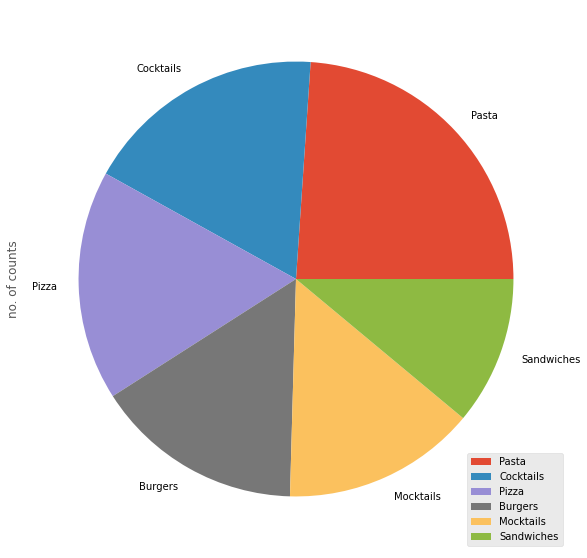

In [20]:
x[0:6].plot(kind = 'pie',y = 'no. of counts', figsize=(10, 10))

Top 5 Dishes:


In [21]:
x.head(5)

,no. of counts
Pasta,7048
Cocktails,5307
Pizza,5040
Burgers,4566
Mocktails,4239


Last 5 Dishes


In [22]:
x.tail(5)

,no. of counts
Mango ShakeChicken Tikka Masala,3
Butter NaanGhee Rice,3
Vegetable BiryaniPrawn Biryani,3
Gongura BiryaniPesto Pizza,3
Gulab JamunRooftop AmbienceSalads,3


Inferences:

    - Sales of Dishes.
    - Which dish is liked by more people.
    - Pasta, Cocktails, Pizza are liked by most of the people whereas Salted CaramelRasgulla, AppamFaluda , NoodlesBbq Pizza are having the least count.

# Number of orders in each hotel in Bangalore

The below code performs an aggregation operation on the MongoDB collection. It groups the documents based on the "name" field, counts the number of documents in each group, and then sorts the groups based on the count in descending order. The resulting grouped and sorted documents are stored in the q3_agg_result variable as a list when list() is called.


In [23]:
q3_agg_result=collection.aggregate([{ "$group": {"_id": "$name","count": { "$sum": 1 } } },{"$sort": { "count": -1 }}])
list(q3_agg_result)

[{'_id': 'Cafe Coffee Day', 'count': 288},
 {'_id': 'Onesta', 'count': 255},
 {'_id': 'Just Bake', 'count': 219},
 {'_id': 'Empire Restaurant', 'count': 213},
 {'_id': 'Five Star Chicken', 'count': 210},
 {'_id': 'Kanti Sweets', 'count': 204},
 {'_id': 'Petoo', 'count': 198},
 {'_id': 'Polar Bear', 'count': 195},
 {'_id': 'Baskin Robbins', 'count': 192},
 {'_id': "Chef Baker's", 'count': 186},
 {'_id': 'Pizza Hut', 'count': 186},
 {'_id': 'Subway', 'count': 180},
 {'_id': "Domino's Pizza", 'count': 180},
 {'_id': 'Beijing Bites', 'count': 180},
 {'_id': 'Sweet Truth', 'count': 180},
 {'_id': 'KFC', 'count': 180},
 {'_id': "McDonald's", 'count': 177},
 {'_id': 'Smoor', 'count': 177},
 {'_id': 'Chai Point', 'count': 174},
 {'_id': 'Faasos', 'count': 171},
 {'_id': 'Lassi Shop', 'count': 168},
 {'_id': 'Burger King', 'count': 165},
 {'_id': 'Keventers', 'count': 162},
 {'_id': "Smally's Resto Cafe", 'count': 162},
 {'_id': 'Ambur Hot Dum Biryani', 'count': 159},
 {'_id': 'The French Loaf'

Top 5 Hotels:


In [24]:
q3_agg_result_1=collection.aggregate([{ "$group": {"_id": "$name","count": { "$sum": 1 } } },{"$sort": { "count": -1 }},{"$limit": 5}])
list(q3_agg_result_1)

[{'_id': 'Cafe Coffee Day', 'count': 288},
 {'_id': 'Onesta', 'count': 255},
 {'_id': 'Just Bake', 'count': 219},
 {'_id': 'Empire Restaurant', 'count': 213},
 {'_id': 'Five Star Chicken', 'count': 210}]

Last 5 Hotels:


In [25]:
q3_agg_result_2=collection.aggregate([{ "$group": {"_id": "$name","count": { "$sum": 1 } } },{"$sort": { "count": 1 }},{"$limit": 5}])
list(q3_agg_result_2)

[{'_id': "Fresh 'N' Grills", 'count': 3},
 {'_id': 'Food Lounge', 'count': 3},
 {'_id': 'Maruti Sweets', 'count': 3},
 {'_id': 'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x82Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© MH-28',
  'count': 3},
 {'_id': 'Amantrana', 'count': 3}]

Inferences:
- Sales in each hotel.
- Which hotels has highest number of customers
- Cafe Coffee Day, Onesta , Just Bake has the highest number of customers whereas Nandini Dosa Camp , Terracotta Whitefield , Bhavani Military Hotel has the least sales

# Number of votes for each hotel

The below code performs an aggregation operation on the MongoDB collection. It groups the documents based on the "name" field, calculates the sum of the "votes" field for each group, and then sorts the groups based on the sum of votes in descending order. The resulting grouped and sorted documents are stored in the q4_agg_result variable as a list when list() is called.


In [26]:
q4_agg_result=collection.aggregate([{ "$group": {"_id": "$name","votes": { "$sum": "$votes" } } },{"$sort": { "votes": -1 }}])
(list(q4_agg_result))

[{'_id': 'Onesta', 'votes': 1042560},
 {'_id': 'Truffles', 'votes': 903177},
 {'_id': 'Empire Restaurant', 'votes': 689424},
 {'_id': 'Hammered', 'votes': 541806},
 {'_id': 'The Black Pearl', 'votes': 516366},
 {'_id': 'Meghana Foods', 'votes': 388671},
 {'_id': 'Barbeque Nation', 'votes': 325275},
 {'_id': "Smally's Resto Cafe", 'votes': 308631},
 {'_id': 'Byg Brewski Brewing Company', 'votes': 298593},
 {'_id': "Gilly's Restobar", 'votes': 296424},
 {'_id': 'Arbor Brewing Company', 'votes': 277086},
 {'_id': 'House Of Commons', 'votes': 271719},
 {'_id': 'Chutney Chang', 'votes': 269730},
 {'_id': "Fenny's Lounge And Kitchen", 'votes': 267549},
 {'_id': "AB's - Absolute Barbecues", 'votes': 259254},
 {'_id': 'Church Street Social', 'votes': 249537},
 {'_id': 'Prost Brew Pub', 'votes': 235827},
 {'_id': 'The Biere Club', 'votes': 229947},
 {'_id': 'Stoner', 'votes': 225582},
 {'_id': 'Koramangala Social', 'votes': 225063},
 {'_id': 'Barleyz', 'votes': 223344},
 {'_id': 'The Boozy Grif

Top 5 highly voted Hotels:


In [27]:
q4_agg_result_1=collection.aggregate([{ "$group": {"_id": "$name","votes": { "$sum": "$votes" } } },{"$sort": { "votes": -1 }},{"$limit": 5}])
list(q4_agg_result_1)

[{'_id': 'Onesta', 'votes': 1042560},
 {'_id': 'Truffles', 'votes': 903177},
 {'_id': 'Empire Restaurant', 'votes': 689424},
 {'_id': 'Hammered', 'votes': 541806},
 {'_id': 'The Black Pearl', 'votes': 516366}]

Last 5 Hotels:


In [28]:
q4_agg_result_2=collection.aggregate([{ "$group": {"_id": "$name","votes": { "$sum": "$votes" } } },{"$sort": { "votes": 1 }},{"$limit": 5}])
list(q4_agg_result_2)

[{'_id': 'Hotel New Karthik', 'votes': 0},
 {'_id': 'Funjabi Times', 'votes': 0},
 {'_id': 'Navaruchi', 'votes': 0},
 {'_id': 'Santhrupthi Halli Mane', 'votes': 0},
 {'_id': 'Chillax Point', 'votes': 0}]

Inferences:
- Counts of the votes for each orders wrt hotels.
- Onesta, Truffles , Empire Restaurant are getting high votes but Zuiqa Taste, Nourich, Remos Kitchen are having least votes.

# About Menu


The below code retrieves documents from  MongoDB collection based on a query and stores the values of the "name" field in a list. Here's a breakdown of the code:

q5_1 = [] initializes an empty list called q5_1, which will be used to store the values of the "name" field.

for rec in collection.find({'menu_item': {'$ne': '[]'}}): starts a loop that iterates over the documents in the collection. The find() method is used to retrieve documents from the collection, and the query {'menu_item': {'$ne': '[]'}} is specified as a filter. This filter selects only the documents where the value of the "menu_item" field is not an empty list (represented as '[]').

q5_1.append(rec.get('name')) retrieves the value of the "name" field from each document using the get() method and appends it to the q5_1 list. The rec.get('name') retrieves the value of the "name" field from the current document rec.

print(len(q5_1)) prints the length of the q5_1 list, which represents the number of documents that satisfy the query condition.

print((q5_1)) prints the contents of the q5_1 list, which contains the values of the "name" field from the selected documents.

Therefore, the code retrieves documents from the MongoDB collection where the "menu_item" field is not an empty list. It extracts the values of the "name" field from these documents and stores them in the q5_1 list. The code then prints the length of the list and the values contained within it.

Hotels with menu:

In [29]:
q5_1=[]
for rec in collection.find({'menu_item':{'$ne':'[]'}}):
    q5_1.append(rec.get('name'))

print(len(q5_1))
print((q5_1))

36300
['Sweet Truth', 'Faasos', 'Maruthi Davangere Benne Dosa', 'Kitchen Garden', 'Recipe', 'Tasty Bytes', 'Shree Cool Point', 'FreshMenu', "Namma Brahmin's Idli", 'Sri Guru Kottureshwara Davangere Benne Dosa', 'Bengaluru Coffee House', 'Anna Kuteera', 'Vijayalakshmi', 'Sri Udupi Food Hub', 'Udupi Upahar', "New Gowda's Fried Chicken", 'HOT COFFEE', 'Sagar Deluxe', 'Grazers', 'By 2 Coffee', 'Davangere Butter Dosa Hotel', 'Mulabagilu Dosa', 'Udupi Ruchi', 'Cool Corner', 'Matru Sagar', 'In Time Cane Juice', 'Srikrishna Bhavan', 'Chumma Delicious', 'SSV Upahar', 'Dwaraka Grand', "Tanna's Kitchen", 'Shree Mandarathi Grand', 'South Kitchen', 'Shanthi Sagar', 'Kamat Bugle Rock', 'Puliyogare Point', 'Bangalore Agarwal Bhavan', 'Udupi Ruchi Grand', 'Just Thindi', 'Matru Sagar', 'Vasanth Vihar - Since 1965', 'Mast Punjabi', 'South Grand', 'Dakshin Grand', 'Chai Mane', 'Kaapi Kendra', 'The Krishna Grand Xpress', 'Coffee Tindi', 'Drunken Monkey', 'Lalbagh Grand', 'Sri Krishna Aramane', 'Swarga Ruc

Hotels without menu:


In [30]:
q5_2=[]
for rec in collection.find({'menu_item':{'$eq':'[]'}}):
    q5_2.append(rec.get('name'))

print(len(q5_2))
print((q5_2))

118851
['Jalsa', 'Spice Elephant', 'San Churro Cafe', 'Addhuri Udupi Bhojana', 'Grand Village', 'Timepass Dinner', 'Rosewood International Hotel - Bar & Restaurant', 'Onesta', 'Penthouse Cafe', 'Smacznego', 'CafÃ\x83Â\x83Ã\x82Â\x83Ã\x83Â\x82Ã\x82Â\x83Ã\x83Â\x83Ã\x82Â\x82Ã\x83Â\x82Ã\x82Â© Down The Alley', 'Cafe Shuffle', 'The Coffee Shack', 'Caf-Eleven', 'San Churro Cafe', 'Cafe Vivacity', 'Catch-up-ino', "Kirthi's Biryani", 'T3H Cafe', '360 Atoms Restaurant And Cafe', 'The Vintage Cafe', 'Woodee Pizza', 'Cafe Coffee Day', 'My Tea House', 'Hide Out Cafe', 'CAFE NOVA', 'Coffee Tindi', 'Sea Green Cafe', 'Cuppa', "Srinathji's Cafe", 'Redberrys', 'Foodiction', 'Ovenstory Pizza', 'Behrouz Biryani', 'Fast And Fresh', 'Szechuan Dragon', 'Empire Restaurant', 'Chaatimes', 'Havyaka Mess', "McDonald's", "Domino's Pizza", 'Onesta', 'Hotboxit', 'Beijing Bites', 'Petoo', 'Corner House Ice Cream', 'Biryanis And More', 'Roving Feast', 'Banashankari Donne Biriyani', 'Wamama', 'Five Star Chicken', 'XO Be

Inferences:
- In this data there are hotels with menu and without menu so we can separate it request them to give their menu.
- 12100 hotels are having menu.
- 39617 hotels are not having their menu.

# About table booking and online ordering

The below code performs an aggregation operation on the MongoDB collection. It groups the documents based on the unique combinations of "book_table" and "online_order" fields, adds the corresponding "name" field values to an array within each group, and sorts the groups based on the "_id" field. The resulting grouped and sorted documents are stored in the q6_agg_result variable.

In [31]:
q6_agg_result=collection.aggregate([{ "$group": {"_id": {"booking table": "$book_table","online order": "$online_order"},"count": { "$addToSet": "$name" } }},{"$sort": { "_id": -1 }}])

In [32]:
list(q6_agg_result)

[{'_id': {'booking table': 'Yes', 'online order': 'Yes'},
  'count': ['Yo! Chow',
   'My Tea House',
   'BANGALORE BOX',
   'Punjabi by Nature 2.0',
   'Eden Park',
   'Roots',
   'Byblos',
   'Paradise',
   'Seasons',
   'Spice Kitchen',
   'Pakwan',
   'Dodda Mane Donne Biryani',
   'Suvai Factory',
   'Portland Steakhouse & Cafe',
   'OKI',
   'Enerjuvate Studio & Cafe',
   'North Met South',
   'Red Rhino',
   'Noodle Bar',
   'PagalKhana',
   'Malabar Bay',
   'Hungry Vihaari',
   'The Rice Bowl',
   'Laughing Llama Gastropub',
   'Smoke - The Sizzler House',
   'Amour Fine Patisserie',
   'The Hidden Home',
   'The Whitefield Arms Pub & Microbrewery',
   'Salt Mango Tree',
   'Two Friends Cauldron',
   'Punjabi Times',
   'Chicken Man',
   'Little Italy',
   'Cafe Mangii',
   'Grapevine',
   'Samaikya',
   'Salted Chilli',
   'Wokanaka - The Casual Chinese Pitstop',
   'Vietnamese Kitchen',
   'Cafe Azzure',
   'Lazy Suzy',
   'Cafe Braqa',
   'Sholay - The Barbeque',
   'Herbs &

Inference
- From this we can get Booking and Online ordering information

# Number of orders in each hotel in each Area in Bangalore

The below code performs an aggregation operation on the MongoDB collection. It groups the documents based on the unique combinations of "name" and "location" fields, calculates the count of documents within each group, and then sorts the groups based on the count in descending order. The resulting grouped and sorted documents are stored in the q7_agg_result variable as a list when list() is called.


In [33]:
q7_agg_result= collection.aggregate([{"$group": {"_id": {"name":"$name" ,"location":"$location" },"count": { "$sum": 1 }}},{"$sort": { "count": -1 }}])
list(q7_agg_result)

[{'_id': {'name': 'Hammered', 'location': 'Cunningham Road'}, 'count': 102},
 {'_id': {'name': 'Dolci Desserts', 'location': 'Cunningham Road'},
  'count': 75},
 {'_id': {'name': 'The Chocolate Heaven', 'location': 'Commercial Street'},
  'count': 72},
 {'_id': {'name': 'Tiger Trail - Ramada Hotel', 'location': 'Shivajinagar'},
  'count': 69},
 {'_id': {'name': 'Berrylicious Cafe', 'location': 'MG Road'}, 'count': 66},
 {'_id': {'name': 'ThrowBack - Pub & Dine', 'location': 'Langford Town'},
  'count': 66},
 {'_id': {'name': 'Hatti Punjab Di', 'location': 'Brigade Road'}, 'count': 66},
 {'_id': {'name': 'Fresh Pressery Cafe', 'location': 'Koramangala 5th Block'},
  'count': 63},
 {'_id': {'name': 'Stoner', 'location': 'Koramangala 5th Block'}, 'count': 63},
 {'_id': {'name': 'Maxpresso', 'location': 'Koramangala 7th Block'},
  'count': 63},
 {'_id': {'name': 'Chillout', 'location': 'BTM'}, 'count': 63},
 {'_id': {'name': 'Bistro Claytopia', 'location': 'Koramangala 1st Block'},
  'coun

Top 5 orders in Hotels w.r.t areas:


In [34]:
q7_agg_result_1= collection.aggregate([{"$group": {"_id": {"name":"$name" ,"location":"$location" },"count": { "$sum": 1 }}},{"$sort": { "count": -1 }},{"$limit": 5}])
list(q7_agg_result_1)

[{'_id': {'name': 'Hammered', 'location': 'Cunningham Road'}, 'count': 102},
 {'_id': {'name': 'Dolci Desserts', 'location': 'Cunningham Road'},
  'count': 75},
 {'_id': {'name': 'The Chocolate Heaven', 'location': 'Commercial Street'},
  'count': 72},
 {'_id': {'name': 'Tiger Trail - Ramada Hotel', 'location': 'Shivajinagar'},
  'count': 69},
 {'_id': {'name': 'Hatti Punjab Di', 'location': 'Brigade Road'}, 'count': 66}]

Least 5 orders in Hotels w.r.t towns:

In [35]:
q7_agg_result_2= collection.aggregate([{"$group": {"_id": {"name":"$name" ,"location":"$location" },"count": { "$sum": 1 }}},{"$sort": { "count": 1 }},{"$limit": 5}])
list(q7_agg_result_2)

[{'_id': {'name': 'Kadalu Sea Food Restaurant', 'location': 'Vijay Nagar'},
  'count': 3},
 {'_id': {'name': 'New Andhra Spice', 'location': 'Electronic City'},
  'count': 3},
 {'_id': {'name': 'Lazeez Corner', 'location': 'Bommanahalli'}, 'count': 3},
 {'_id': {'name': 'Hotel Thalassery', 'location': 'Electronic City'},
  'count': 3},
 {'_id': {'name': 'Bombay Kulfi', 'location': 'Basavanagudi'}, 'count': 3}]

Inference:
- Sales in each town in Banglore

# Available cuisines


The below code performs an aggregation operation on MongoDB collection to retrieve unique values from the "cuisines" field and stores them in a list. Here's a breakdown of the code:

q8_agg_result is a variable that will hold the result of the aggregation operation.

collection.aggregate([...]) executes the aggregation pipeline on the specified collection. The pipeline is defined within the square brackets.

[{"$group": {"_id": "$cuisines"}}] is the aggregation pipeline, consisting of a single stage: $group.

$group is a MongoDB aggregation operator that groups documents together based on a specified key or field. In this case, it groups documents based on the "cuisines" field.

"_id": "$cuisines" specifies that the grouping will be performed based on the unique values of the "cuisines" field. Each unique value will become a separate group, and the resulting grouping is stored in the "_id" field.
The q8_agg_result variable contains the grouped documents with the unique values of the "cuisines" field.

q8=[] initializes an empty list called q8, which will be used to store the values from the aggregation result.

for res in list(q8_agg_result): starts a loop that iterates over the documents in the q8_agg_result aggregation result.

q8.append(res.get('_id')) retrieves the value of the "_id" field from each document using the get() method and appends it to the q8 list. The res.get('_id') retrieves the value of the "_id" field from the current document res.

The loop continues to iterate over all the documents in q8_agg_result, appending the values of the "_id" field to the q8 list.

After the loop, the q8 list contains the unique values of the "cuisines" field obtained from the aggregation result.

Therefore, the code performs an aggregation operation on the MongoDB collection to group documents based on the "cuisines" field and retrieves the unique values of the "cuisines" field. These unique values are then stored in the q8 list.

Most available cuisins:

In [36]:
q8_agg_result= collection.aggregate([{"$group": {"_id":"$cuisines"}}])
q8=[]
for res in list(q8_agg_result):
    q8.append(res.get('_id'))

The below code is performing some operations on a NumPy array and a Pandas DataFrame to obtain the count of unique values in the "cusins" column. Here's a breakdown of the code:

q8=np.array(q8) converts the q8 list to a NumPy array. This allows for easier manipulation and computation using NumPy functions.

q8_1=np.array([]) initializes an empty NumPy array called q8_1, which will be used to store the split values from q8.

The loop for i in range(len(q8)): iterates over the elements in q8.

q8i=q8[i] assigns the current element from q8 to the variable q8i.

q8_1=np.append(q8_1, (np.array(str(q8i).split(", ")))) splits the string representation of q8i using the delimiter ", " and appends the resulting array to q8_1 using np.append().

str(q8i) converts the current element q8i to a string.
split(", ") splits the string using ", " as the delimiter, resulting in an array of split values.
np.array() creates a NumPy array from the split values.
np.append(q8_1, ...) appends the newly created array to the existing q8_1 array.
dfq8 = pd.DataFrame({'cusins':q8_1}) creates a Pandas DataFrame named dfq8 with a single column called "cusins" using the values from the q8_1 array.

x=(dfq8['cusins'].value_counts()) computes the count of unique values in the "cusins" column of the dfq8 DataFrame using the value_counts() method. The result is assigned to the variable x.

x=x.to_frame() converts the x Series (result of value_counts()) into a DataFrame using the to_frame() method. This allows for easier manipulation and further operations.

x=x.set_axis(['no. of counts'], axis=1, inplace=False) sets the column name of the DataFrame to "no. of counts" using the set_axis() method. This provides a descriptive label for the count column.

axis=1 specifies that the column label is being set.
inplace=False ensures that the original DataFrame is not modified, and a new DataFrame is returned with the updated column label.

Therefore, the code converts the q8 list to a NumPy array, splits the values from the array, and stores them in q8_1. It then creates a Pandas DataFrame dfq8 with the split values in the "cusins" column. The code computes the count of unique values in the "cusins" column and stores it in the x DataFrame. Finally, the column label of the x DataFrame is set to "no. of counts" for better readability.

In [37]:
q8=np.array(q8)
q8_1=np.array([])
for i in range(len(q8)):
    q8i=q8[i]
    q8_1=np.append(q8_1,(np.array(str(q8i).split(", "))))
dfq8 = pd.DataFrame({'cusins':q8_1})
x=(dfq8['cusins'].value_counts())
x=x.to_frame()
x=x.set_axis(['no. of counts'], axis=1, inplace=False)

In [38]:
x

,no. of counts
North Indian,1208
Chinese,1027
Fast Food,554
Continental,543
South Indian,497
...,...
Raw Meats,1
Indian,1
Vegan,1
Jewish,1


<AxesSubplot:>

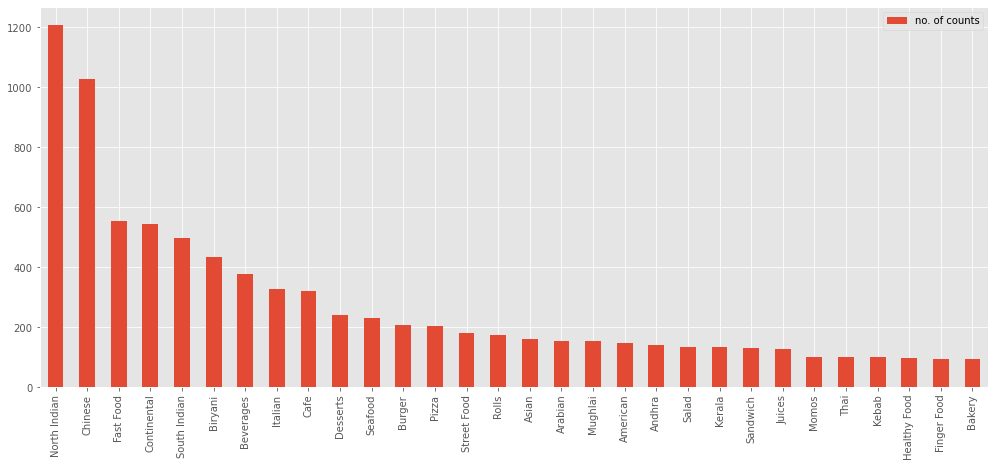

In [39]:
x[0:30].plot(kind = 'bar', y = 'no. of counts')

<AxesSubplot:>

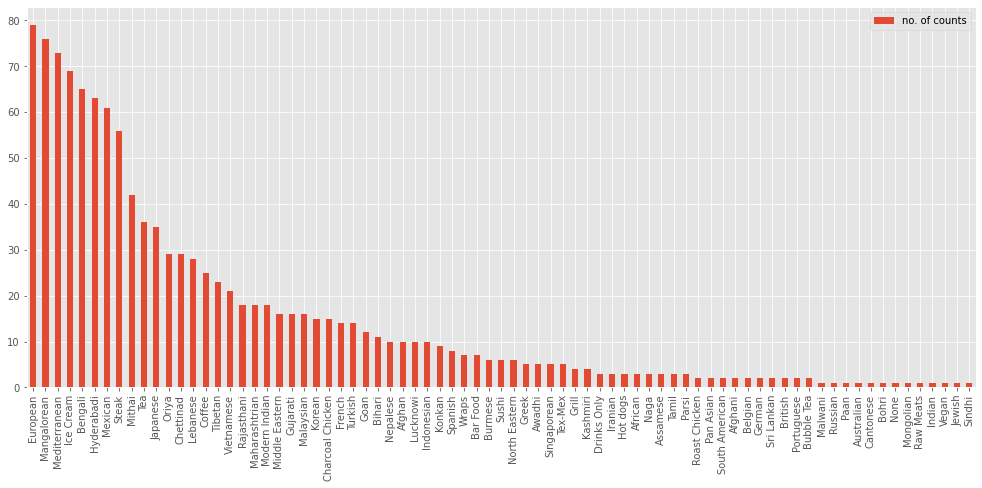

In [40]:
x[31:].plot(kind = 'bar', y = 'no. of counts')

Top & bottom 5 cuisines:


In [41]:
x.head(5)

,no. of counts
North Indian,1208
Chinese,1027
Fast Food,554
Continental,543
South Indian,497


In [42]:
x.tail(5)

,no. of counts
Raw Meats,1
Indian,1
Vegan,1
Jewish,1
Sindhi,1


Inference
- Availablity of cuisines in Banglore

# Cost efficient And Quality hotels

The below code performs an aggregation operation on MongoDB collection to calculate average ratings and costs for each restaurant and creates a Pandas DataFrame with the results. Here's a breakdown of the code:

q9_agg_result is a variable that will hold the result of the aggregation operation.

collection.aggregate([...]) executes the aggregation pipeline on the specified collection. The pipeline is defined within the square brackets.

[{"$group": {"_id": "$name", "rating": {"$addToSet": "$rate"}, "approx_cost": {"$avg": "$approx_cost(for two people)"}}}, {"$sort": {"_id": -1}}] is the aggregation pipeline, consisting of two stages: $group and $sort.

$group is a MongoDB aggregation operator that groups documents together based on a specified key or field. In this case, it groups documents based on the "name" field.

"_id": "$name" specifies that the grouping will be performed based on the unique values of the "name" field. Each unique name will become a separate group, and the resulting grouping is stored in the "_id" field.

"rating": {"$addToSet": "$rate"} creates a new field called "rating" for each group and adds the "rate" field values to an array within the group. The $addToSet operator is used to add unique values to the array, ensuring that duplicates are not included.

"approx_cost": {"$avg": "$approx_cost(for two people)"} creates a new field called "approx_cost" for each group and calculates the average value of the "approx_cost(for two people)" field within the group using the $avg operator.

$sort is a MongoDB aggregation operator that sorts the documents based on a specified field. In this case, it sorts the documents based on the "_id" field in descending order.

"_id": -1 indicates that the sorting will be done in descending order based on the "_id" field.
The q9_agg_result variable contains the grouped documents with the "name", "rating", and "approx_cost" fields.

val9=[] initializes an empty list called val9, which will be used to store the processed aggregation results.

The first loop for res in list(q9_agg_result): iterates over the documents in the q9_agg_result aggregation result.

l2=[] initializes an empty list called l2 for storing the ratings for the current restaurant.

The second loop for i in (list(res.get('rating'))): iterates over the "rating" array of the current document.

if(i!=None): checks if the current rating value i is not None.

if "/" in i: checks if the current rating value i contains a "/" character.

l2.append(float(i.split( "/" )[0])) splits the rating value i using the "/" character as the delimiter and appends the first part (before the "/") as a floating-point number to the l2 list.

val9.append([res.get('_id'),l2,res.get('approx_cost')]) appends a list to val9 containing the restaurant name (_id), the list of ratings (l2), and the average cost (approx_cost) for the current restaurant.

q9_1=[] initializes an empty list called q9_1, which will be used to store the filtered and formatted results.

The third loop for i in val9: iterates over the elements in val9.

if (len(i[1])!=0): checks if the length of the rating list (i[1]) is not zero.

q9_1.append([i[0],round(np.average(i[1]),2),i[2]]) appends a list to q9_1 containing the restaurant name (i[0]), the rounded average rating (round(np.average(i[1]),2)), and the cost (i[2]) for the current restaurant.

df=pd.DataFrame(q9_1) creates a Pandas DataFrame named df using the data from the q9_1 list.

df.columns=['name','rating','cost (two persons)'] sets the column names of the DataFrame to 'name', 'rating', and 'cost (two persons)' using the columns attribute.

df=df.dropna() drops any rows in the DataFrame that contain missing values (NaN).

df.sort_values(by=['rating','cost (two persons)'],ascending=[False,True], na_position = 'first') sorts the DataFrame based on the 'rating' and 'cost (two persons)' columns in descending order for 'rating' and ascending order for 'cost (two persons)'. The na_position = 'first' argument ensures that rows with missing values are placed at the beginning.

Therefore, the code performs an aggregation operation on a MongoDB collection to calculate average ratings and costs for each restaurant. It then processes and filters the results, creating a Pandas DataFrame with the restaurant name, rounded average rating, and cost. Finally, the DataFrame is sorted based on the rating and cost columns in the specified order.

In [43]:
q9_agg_result= collection.aggregate([{"$group": {"_id":"$name" ,"rating": { "$addToSet":"$rate" },"approx_cost": { "$avg":"$approx_cost(for two people)"} }},
                                      {"$sort": { "_id": -1 }}])
    
val9=[]
for res in list(q9_agg_result):
    l2=[]
    for i in (list(res.get('rating'))):
#         print(i)
        if(i!=None):
            if "/" in i:
                l2.append(float(i.split( "/" )[0]))
    val9.append([res.get('_id'),l2,res.get('approx_cost')])   
    
    
q9_1=[]
for i in val9:
    if (len(i[1])!=0):
        q9_1.append([i[0],round(np.average(i[1]),2),i[2]])
        
        
df=pd.DataFrame(q9_1)
# df.head(5)
df.columns=['name','rating','cost (two persons)']
df=df.dropna()
df.sort_values(by=['rating','cost (two persons)'],ascending=[False,True], na_position = 'first')

,name,rating,cost (two persons)
6016,Belgian Waffle Factory,4.85,400.0
2487,O.G. Variar & Sons,4.80,200.0
5683,CTR,4.75,150.0
1018,Taaza Thindi,4.70,100.0
2960,Milano Ice Cream,4.70,400.0
...,...,...,...
2998,Meghana Biryani,2.30,800.0
5979,Bhagini,2.28,800.0
953,Taste Of Kerala,2.23,600.0
6140,Bageecha,2.15,650.0


array([<AxesSubplot:title={'center':'rating'}, xlabel='name'>,
       <AxesSubplot:title={'center':'cost (two persons)'}, xlabel='name'>],
      dtype=object)

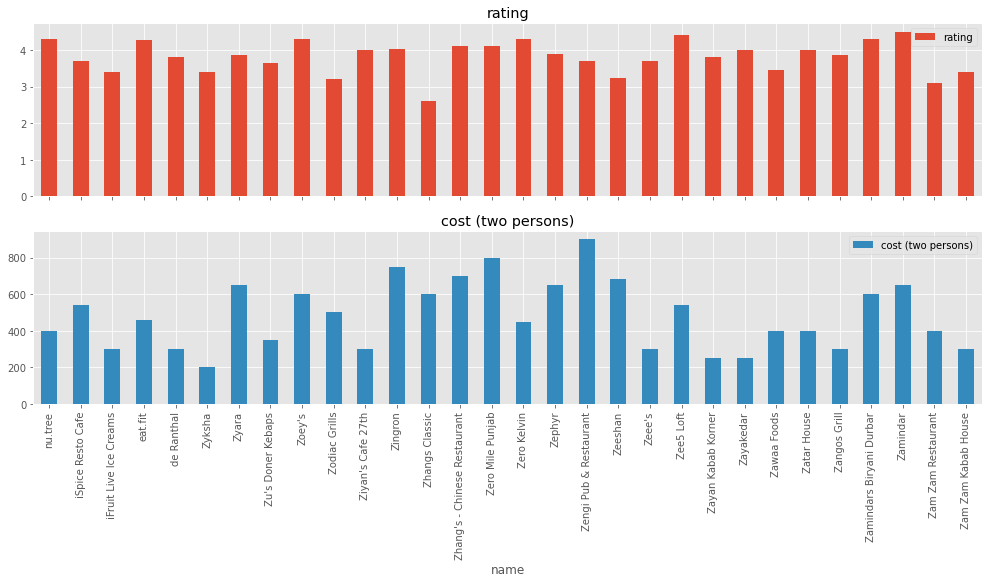

In [44]:
df[0:30].plot(subplots=True,kind = 'bar',x='name')

In [45]:
#thresolds
high_rating=4.5
low_rating =3.5
high_cost = 500
low_cost=500

Best hotels:

(high rating (> 4.5), low cost (<500))



In [46]:
df[(df['rating'] > high_rating) & (df['cost (two persons)'] <low_cost)]

,name,rating,cost (two persons)
600,The Pancake Story,4.60,300.0
817,The Blue Wagon - Kitchen,4.60,400.0
1018,Taaza Thindi,4.70,100.0
2487,O.G. Variar & Sons,4.80,200.0
2845,Mugful Of Stories,4.60,300.0
2960,Milano Ice Cream,4.70,400.0
3416,Kurtoskalacs,4.65,390.0
4893,Dock Frost'd,4.60,400.0
5683,CTR,4.75,150.0
6016,Belgian Waffle Factory,4.85,400.0


Average hotels:

(low rating (<3.5), high cost (>500)) & (high rating (>4.5), high cost (>500))



In [47]:
df[((df['rating'] < low_rating) & (df['cost (two persons)'] >low_cost))|((df['rating'] > high_rating) & (df['cost (two persons)'] >high_cost))].sort_values(by=['rating','cost (two persons)'],ascending=[False,False], na_position = 'first')

,name,rating,cost (two persons)
4825,ECHOES Koramangala,4.70,750.0
3257,Lot Like Crepes,4.63,550.0
401,Truffles,4.60,900.0
6151,Baar Union,4.60,850.0
4225,Here & Now,4.60,750.0
...,...,...,...
2131,Punjabi Daawat,2.40,550.0
2998,Meghana Biryani,2.30,800.0
5979,Bhagini,2.28,800.0
953,Taste Of Kerala,2.23,600.0


Below Average hotels:

(low rating(<3.5), low cost(<500))


In [48]:
df[(df['rating'] < low_rating) & (df['cost (two persons)'] <low_cost)]

,name,rating,cost (two persons)
3,iFruit Live Ice Creams,3.40,300.0
9,Zyksha,3.40,200.0
30,Zawaa Foods,3.45,400.0
36,Zam Zam Restaurant,3.10,400.0
37,Zam Zam Kabab House,3.40,300.0
...,...,...,...
6614,360 Atoms Restaurant And Cafe,3.10,400.0
6622,24/7 Food Service,2.95,300.0
6634,1980s Games Cafe,3.40,400.0
6645,1000 B.C,3.20,300.0


# About Rest type

The below code is performing an aggregation operation on MongoDB collection to group documents by the "name" field and create a set of unique values for the "rest_type" field within each group. Here's a breakdown of the code:

q10_agg_res is a variable that will hold the result of the aggregation operation.

collection.aggregate([...]) executes the aggregation pipeline on the specified collection. The pipeline is defined within the square brackets.

[{"$group": {"_id": {"name": "$name"}, "rest type": {"$addToSet": "$rest_type"}}}] is the aggregation pipeline, consisting of a single $group stage.

$group is a MongoDB aggregation operator that groups documents together based on a specified key or field. In this case, it groups documents based on the "name" field.

"_id": {"name": "$name"} specifies that the grouping will be performed based on the unique values of the "name" field. Each unique name will become a separate group, and the resulting grouping is stored in the "_id" field.

"rest type": {"$addToSet": "$rest_type"} creates a new field called "rest type" for each group and adds the unique values of the "rest_type" field to a set within the group. The $addToSet operator is used to add unique values to the set, ensuring that duplicates are not included.

The q10_agg_res variable contains the grouped documents with the "name" field as the grouping key and the "rest_type" field values stored in a set within each group.


In [49]:
q10_agg_res = collection.aggregate([{"$group": {"_id":{"name":"$name" },"rest type": { "$addToSet":"$rest_type" }}},])

In [50]:
((list(q10_agg_res)))

[{'_id': {'name': 'Oriental Fusion'}, 'rest type': ['Casual Dining']},
 {'_id': {'name': 'Malabar Hub'}, 'rest type': ['Quick Bites']},
 {'_id': {'name': 'Zinger Cafe'}, 'rest type': ['Quick Bites, Beverage Shop']},
 {'_id': {'name': 'Sri Sai Mango Tree Restaurant'},
  'rest type': ['Casual Dining']},
 {'_id': {'name': '70 Brigade - Iris Hotel'}, 'rest type': ['Casual Dining']},
 {'_id': {'name': 'Happy Cups'}, 'rest type': ['Quick Bites']},
 {'_id': {'name': 'Saladtimes'}, 'rest type': ['Quick Bites']},
 {'_id': {'name': 'Kopper Pot'}, 'rest type': ['Bakery']},
 {'_id': {'name': "Stop 'N' Joy"}, 'rest type': ['Quick Bites']},
 {'_id': {'name': 'Bakers Day'}, 'rest type': ['Bakery']},
 {'_id': {'name': 'Lluvia Bakery'}, 'rest type': ['Takeaway, Delivery']},
 {'_id': {'name': 'Lassi Shack'},
  'rest type': ['Beverage Shop, Dessert Parlor']},
 {'_id': {'name': 'Kumbakonam Degree Coffee'}, 'rest type': ['Quick Bites']},
 {'_id': {'name': "Guntur's Vandanam Food Zone"},
  'rest type': ['Qu

Collecting data wrt hotel names:

In [51]:
q10_agg_res_1 = collection.aggregate([ { "$match": { "name": 'Lassi Magic' } },{"$group": {"_id":{"name":"$name" },"rest type": { "$addToSet":"$rest_type" }}},])

In [52]:
(list(q10_agg_res_1))

[{'_id': {'name': 'Lassi Magic'},
  'rest type': ['Quick Bites', 'Beverage Shop']}]

Collecting data wrt Rest type:

In [53]:
q10_agg_res_2 = collection.aggregate([ { "$match": { "rest_type": 'Beverage Shop' } },{"$group": {"_id":{"rest_type":"$rest_type" },"name": { "$addToSet":"$name" }}},])

In [54]:
(list(q10_agg_res_2))

[{'_id': {'rest_type': 'Beverage Shop'},
  'name': ['AlienSip',
   'Lassi Ghar',
   'Santosh Juice Junction',
   'Goodness! Beverages',
   'Lassi Top',
   'The Crunch',
   'Chai Makhani',
   'Sabari Juice Junction',
   'Milkacium',
   'Shake N Snack',
   'The Lassi Bar',
   'Lassi Magic',
   'Bobacha',
   'Krishu Juice Centre',
   'Frosty Bite',
   'Classic Lassi Shop',
   'Lassi House',
   'Arabian Tea',
   'Sree Gajanana Juice Centre',
   'Big Straw Blast',
   'Fresh Berriz',
   'Milk N Shakes',
   'Shree Durgamba Juice Centre',
   'Sreeraj Lassi Bar',
   'Sri Ganesh Fruit Juice Centre',
   'Lassi Zone',
   'Slurpy Shakes',
   '5 Degree Centigrade',
   'Assi Tussi Lassi',
   'Sri Ganesha Fruit Juice Centre',
   'Nutripress',
   'Swathi Cool Point',
   'Juice Lounge',
   'Quench & Crunch',
   'Lassi Corner',
   'Sri Venkateshwara Sweets Chats Juice Centre',
   'Shake Tat Bottle',
   'Juice Magic',
   'The ThickShake Factory',
   'Caramel Shake',
   'Shakes Theory',
   'Paani Kum Chai'

# Best rated hotels

The below code groups the documents in the collection by the "name" field, creates an array of unique "rate" values within each group, and calculates the sum of the "votes" field for each group using the MongoDB aggregation pipeline. The result is a grouped dataset with the name, array of ratings, and sum of votes for each group.


In [55]:
q11_agg_res = collection.aggregate([{"$group": {"_id":"$name","rating": { "$addToSet":"$rate" },"value": { "$sum": "$votes" }}},{"$sort": { "value":-1}}])

In [56]:
list(q11_agg_res)

[{'_id': 'Onesta',
  'rating': ['4.6/5', '4.5/5', '4.3/5', '4.3 /5', '4.6 /5', '4.4/5', '4.4 /5'],
  'value': 1042560},
 {'_id': 'Truffles',
  'rating': ['4.5 /5', '4.7/5', '4.6/5', '4.5/5', '4.7 /5'],
  'value': 903177},
 {'_id': 'Empire Restaurant',
  'rating': ['4.2/5',
   '4.0 /5',
   '3.6/5',
   '3.7 /5',
   '3.5/5',
   '4.4/5',
   '4.4 /5',
   '3.5 /5',
   '4.3/5',
   '4.1/5',
   '3.6 /5',
   '3.9/5',
   '4.0/5',
   '4.1 /5',
   '3.9 /5',
   '3.8 /5',
   '3.8/5',
   'NEW'],
  'value': 689424},
 {'_id': 'Hammered',
  'rating': ['NEW', '4.5 /5', '4.6 /5', '4.4 /5', '4.3 /5', '4.7/5', '4.7 /5'],
  'value': 541806},
 {'_id': 'The Black Pearl',
  'rating': ['4.7/5', '4.8/5', '4.8 /5', '4.7 /5'],
  'value': 516366},
 {'_id': 'Meghana Foods',
  'rating': ['4.5/5',
   '4.2/5',
   '4.4/5',
   '4.4 /5',
   '4.5 /5',
   '4.3 /5',
   '4.2 /5',
   '4.3/5'],
  'value': 388671},
 {'_id': 'Barbeque Nation',
  'rating': ['4.8 /5',
   '3.8/5',
   '4.4 /5',
   '4.2/5',
   '4.7/5',
   '4.7 /5',
   '